In [1]:
import scanpy as sc
import omicverse as ov
import pandas as pd
import numpy as np
import os
import itertools
import seaborn as sns
import matplotlib.pyplot as plt
import commot


   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.5.7, Tutorials: https://omicverse.readthedocs.io/


In [2]:
df_ligrec=commot.pp.ligand_receptor_database(database='CellChat', species='human')

In [3]:
def summary_commot_result(adata3,cluster_input):
    database_name = 'user_database'
    combinations = list(itertools.product(set(adata3.obs[cluster_input]), repeat=2))
    combinations.sort()
    weight_dict = {}
    pvalue_dict = {}
    all_key = []
    ### set dict
    for i in combinations:
        weight_dict[i[0]+'-'+i[1]] = []
        pvalue_dict[i[0]+'-'+i[1]] = []
        
    for i in list(adata3.obsp.keys())[2:len(adata3.obsp)]:
        key_use = 'commot-' + database_name + '-'
        pathway = i.replace(key_use,'')
        commot.tl.cluster_communication(adata3, database_name='user_database', clustering=cluster_input,n_permutations=100,pathway_name=pathway)
        cluster_use = 'commot_'+'cluster-'+cluster_input+'-' + database_name + '-'+pathway
        
        ### element_count
        ccc_array = adata3.uns[cluster_use]['communication_pvalue']
        row_count, column_count = ccc_array.shape
        element_count = row_count * column_count
        ###
        comm_weight = adata3.uns[cluster_use]['communication_matrix'].values.reshape(1, element_count)
        comm_pvalue = adata3.uns[cluster_use]['communication_pvalue'].values.reshape(1, element_count)
        for i in range(len(weight_dict.keys())):
            key = list(weight_dict.keys())[i]
            weight_dict[key].append(comm_weight[0][i])
            pvalue_dict[key].append(comm_pvalue[0][i])
        all_key.append(pathway)
    weight_df = pd.DataFrame(weight_dict)
    weight_df.index = all_key
    pvalue_df = pd.DataFrame(pvalue_dict)
    pvalue_df.index = all_key
    weight_df=weight_df.drop('total-total')
    pvalue_df=pvalue_df.drop('total-total')
    return pvalue_df,weight_df

def ccc_weight_fc(weight_df1):
    row_sum = weight_df1.sum(axis=1)
    weight_df1 = weight_df1[row_sum != 0]
    all_multiple_num1 = []
    all_multiple_num2 = []
    for i in range(len(weight_df1.index)):
        index_use = weight_df1.index[i]
        multiple_num1=round(weight_df1.loc[index_use][0]/weight_df1.loc[index_use][1],3)
        all_multiple_num1.append(multiple_num1)
        multiple_num2=round(weight_df1.loc[index_use][1]/weight_df1.loc[index_use][0],3)
        all_multiple_num2.append(multiple_num2)
    fc_df = pd.DataFrame({weight_df1.columns[0]:all_multiple_num1,weight_df1.columns[1]:all_multiple_num2})
    fc_df.index = weight_df1.index
    fc_df = fc_df.sort_values(by=fc_df.columns[1])
    log2_fc_df = fc_df.applymap(lambda x: np.log2(x))
    for column in log2_fc_df:
        max_value = np.nanmax(log2_fc_df[column][log2_fc_df[column] != np.inf])
        min_value = np.nanmin(log2_fc_df[column][log2_fc_df[column] != -np.inf])
        log2_fc_df[column].replace(np.inf, max_value, inplace=True)
        log2_fc_df[column].replace(-np.inf, min_value, inplace=True)
    filtered_df = log2_fc_df[log2_fc_df.max(axis=1) > 0.5]
    return filtered_df

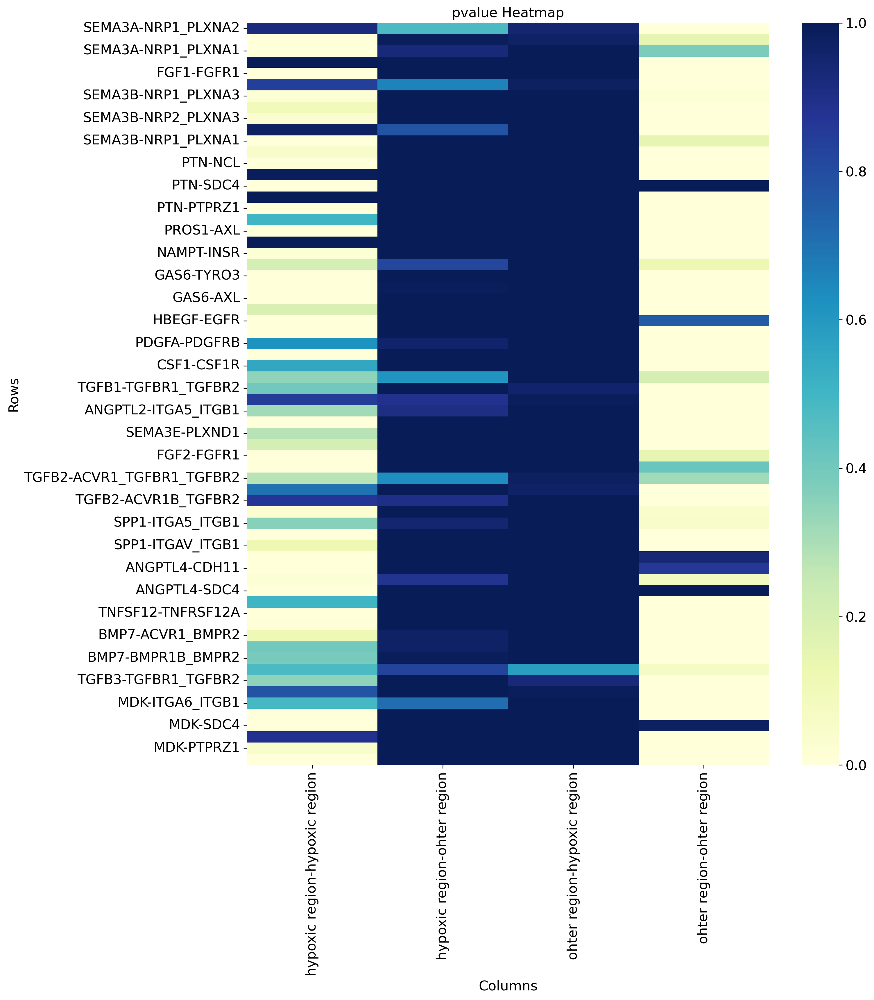

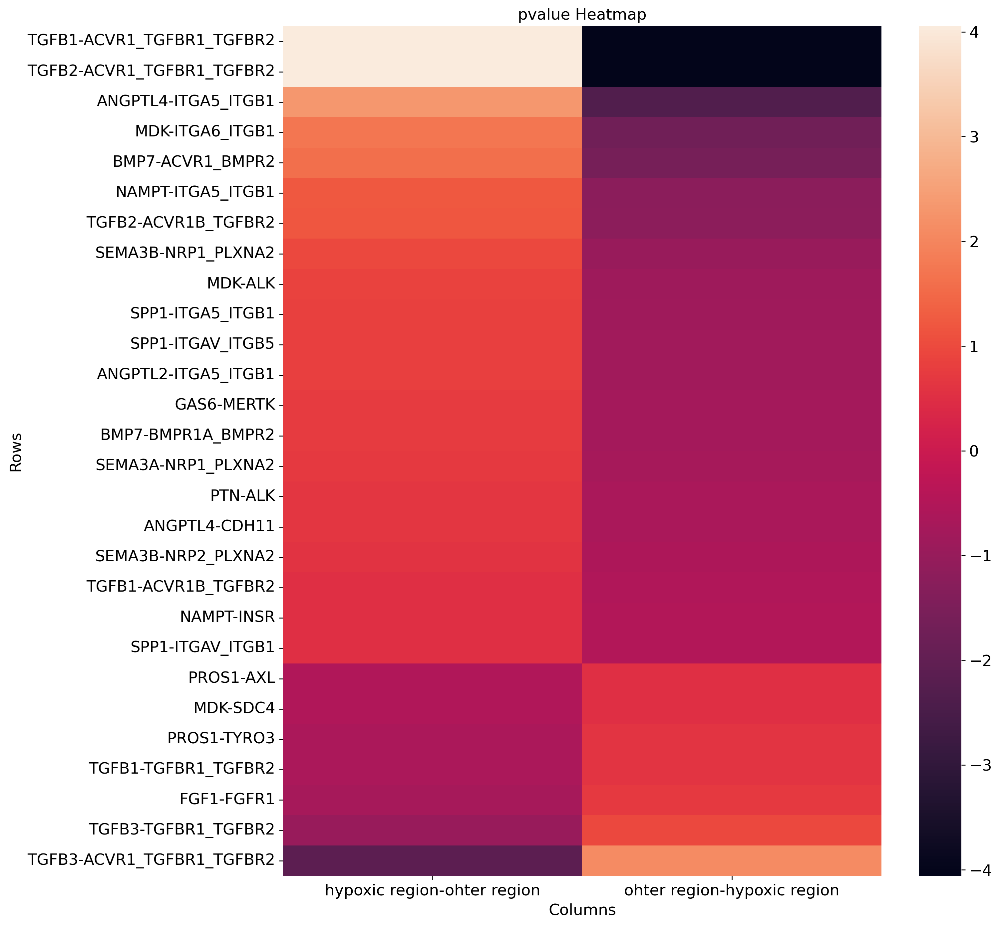

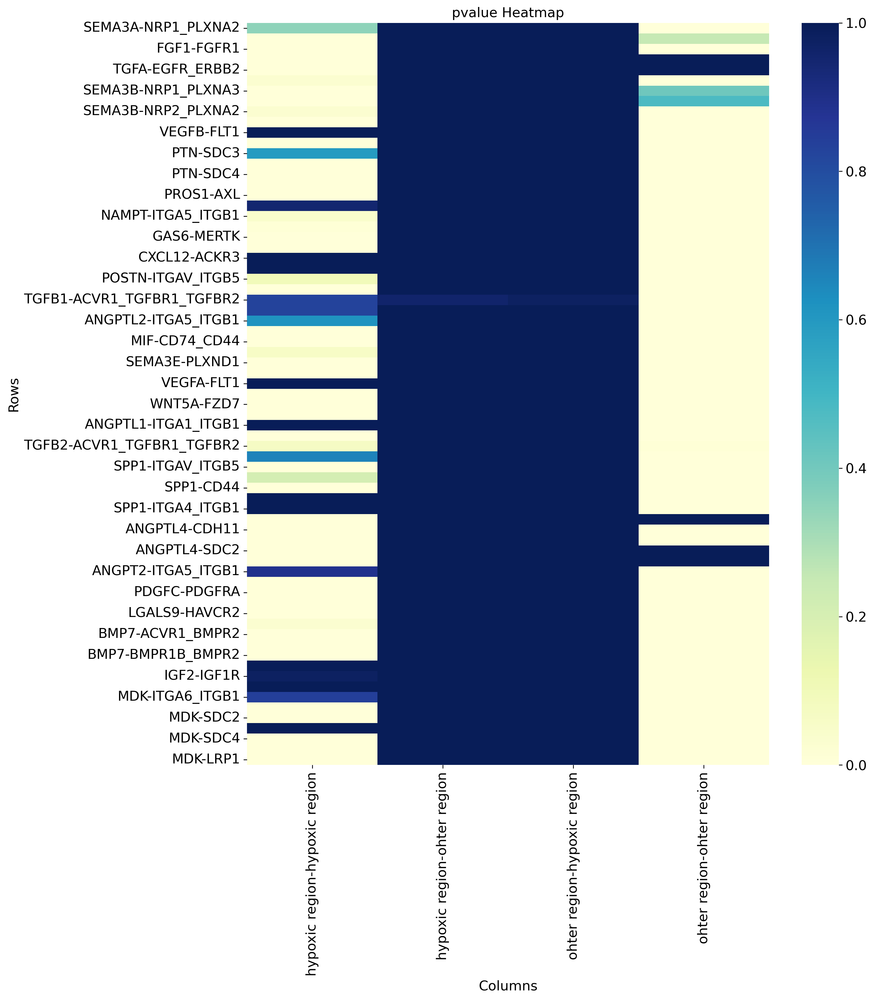

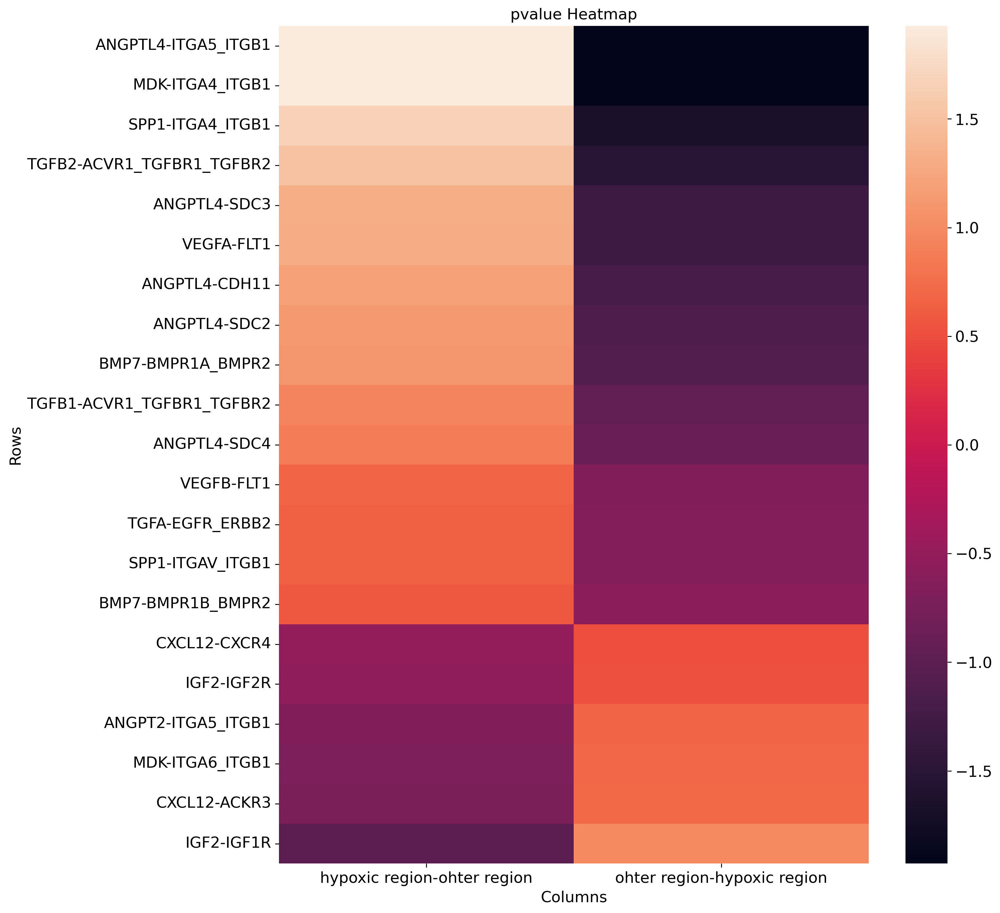

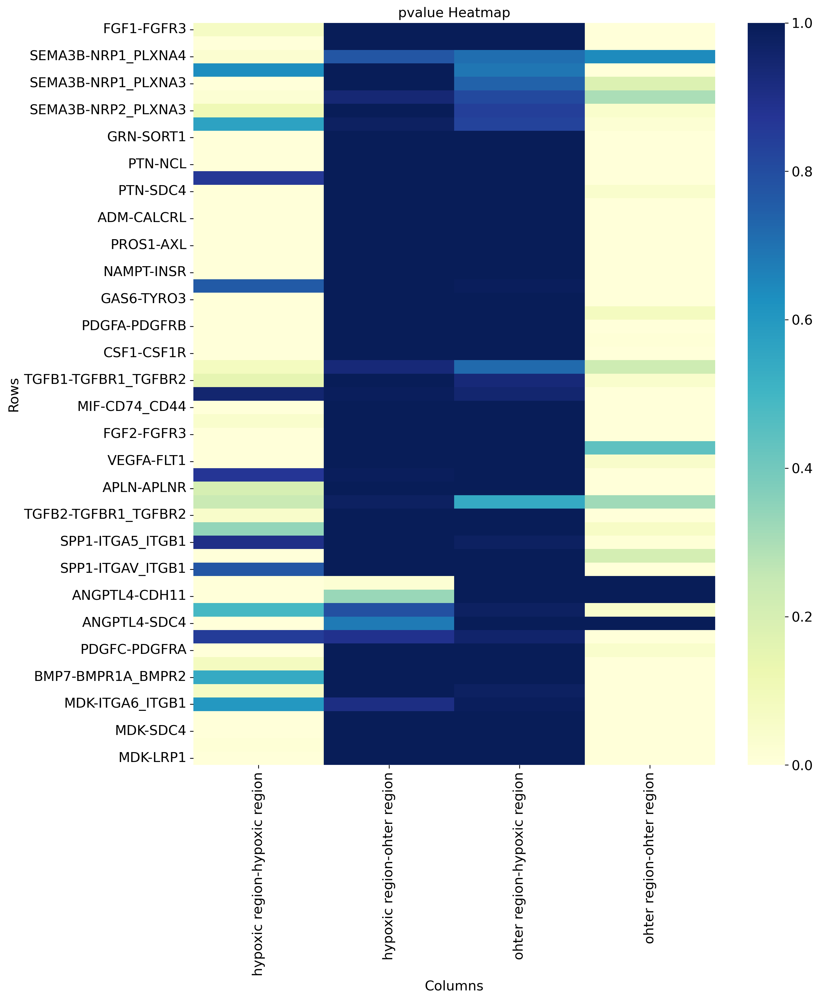

...

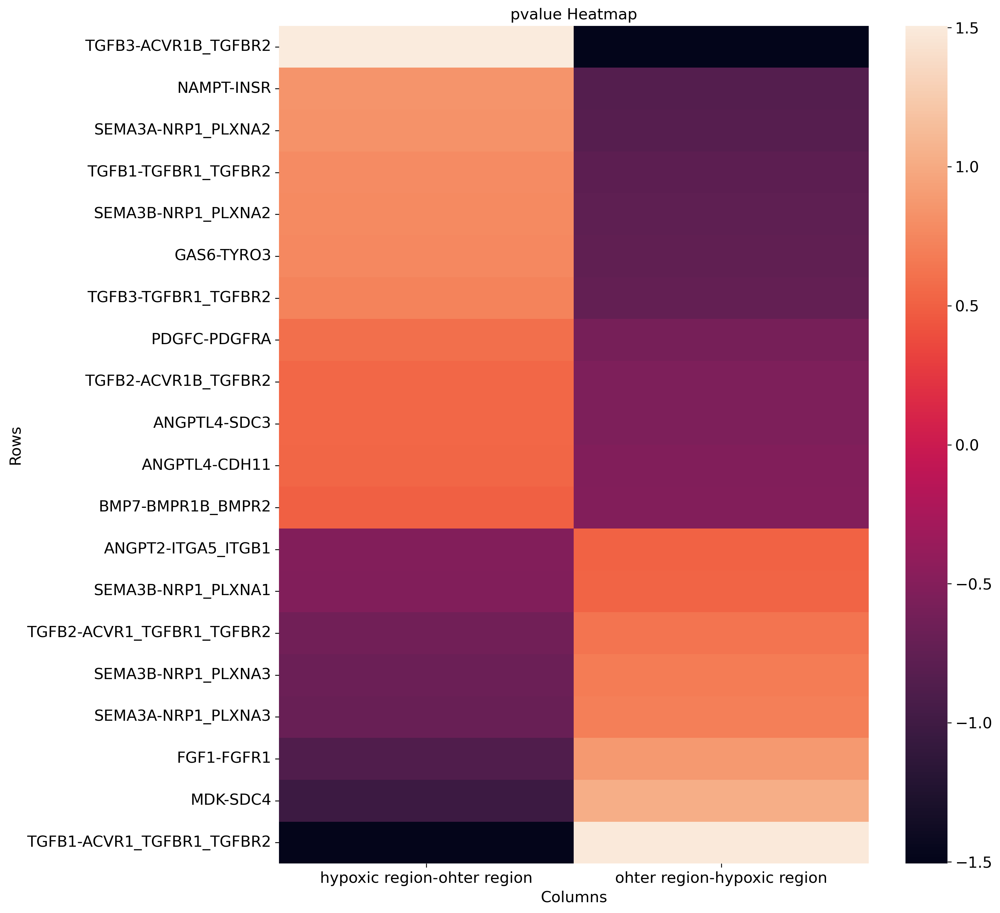

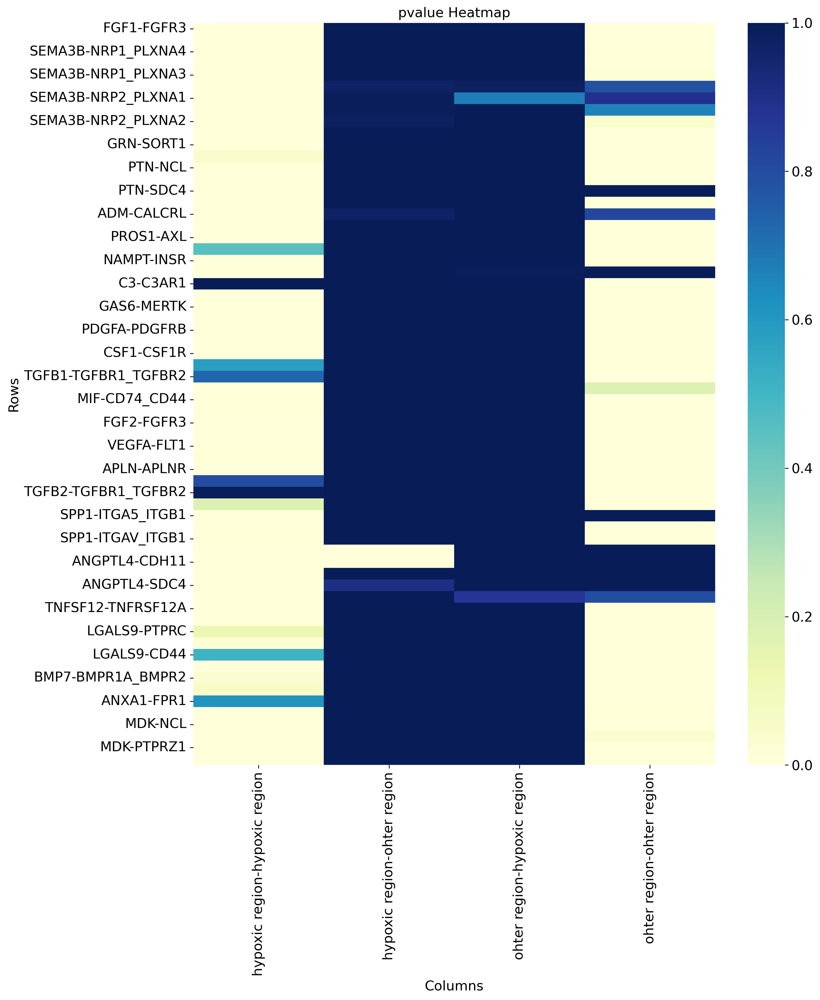

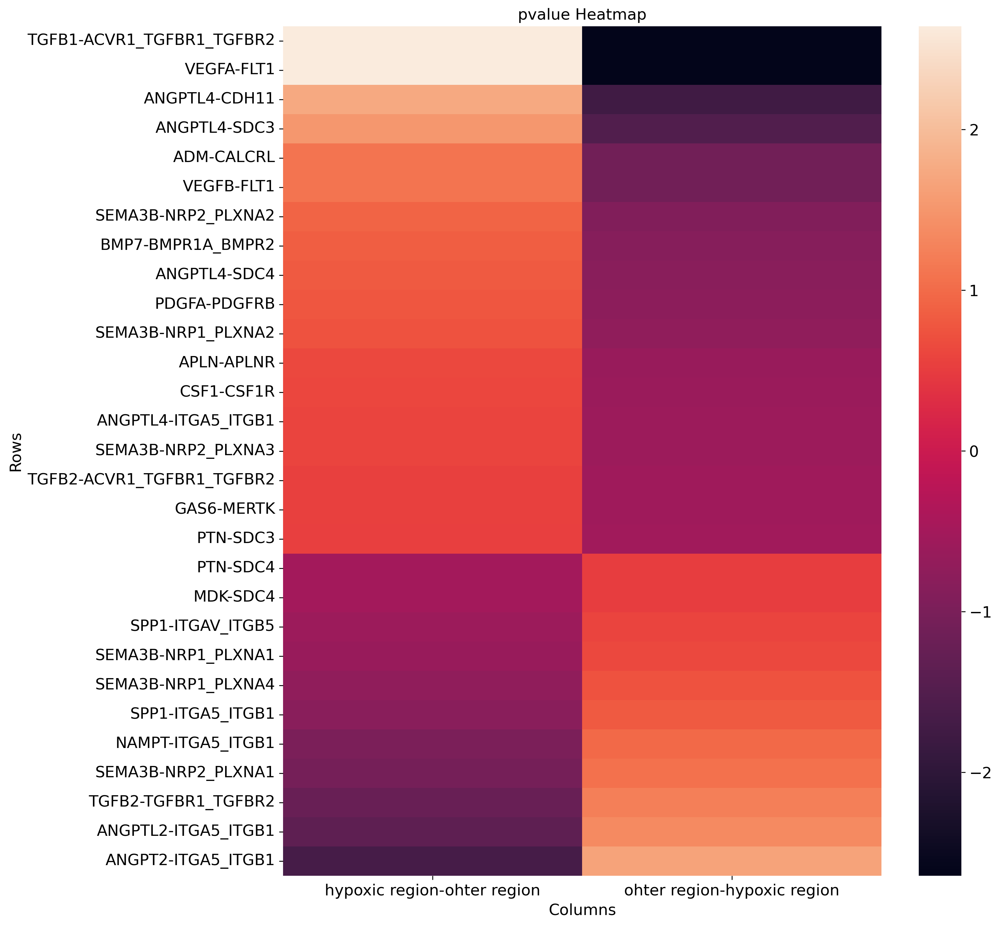

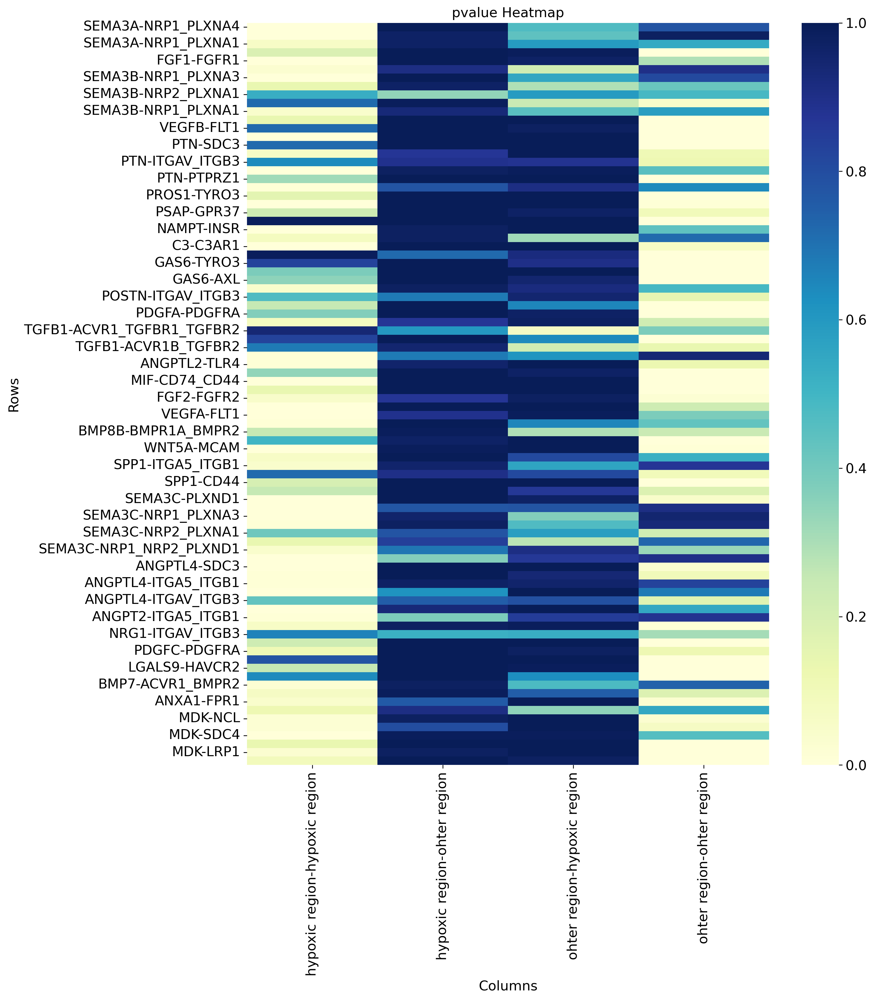

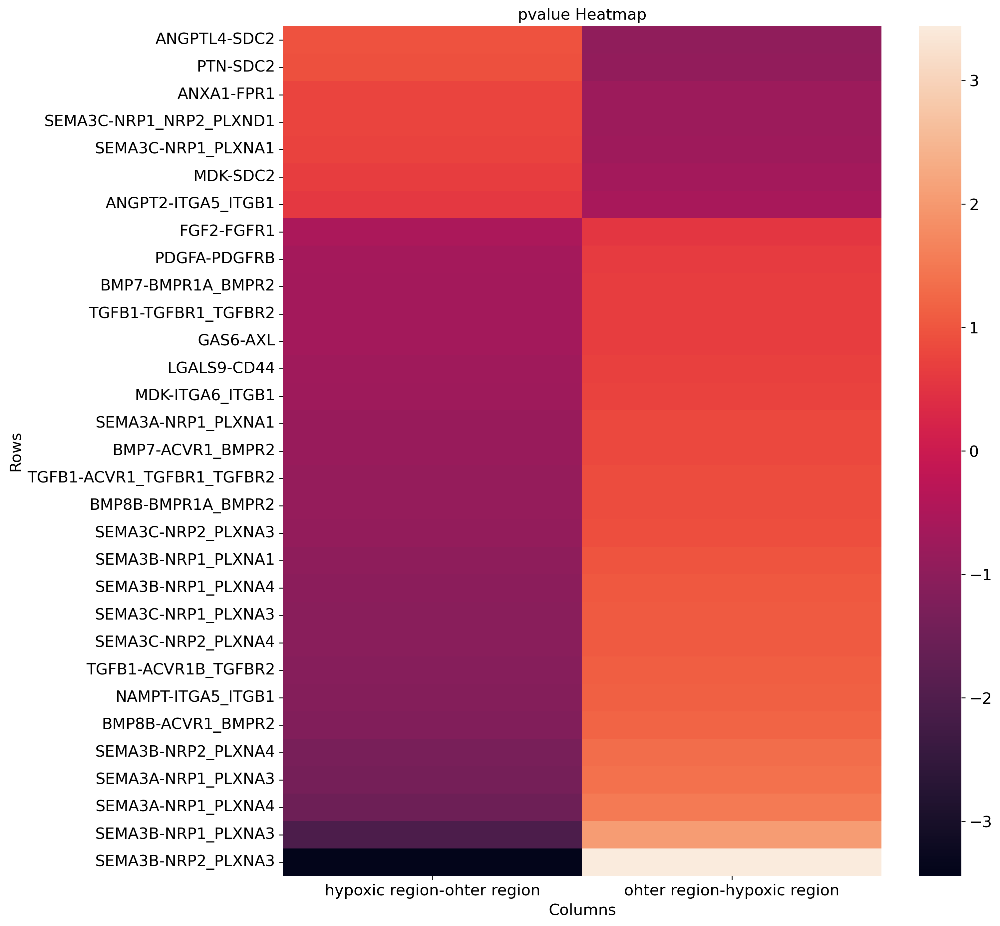

In [4]:
all_cut_adata = os.listdir('/data/jiangjunyao/ji_stereoseq/spatial/cut_hypoxic_h5/')

### main
for i in range(len(all_cut_adata)):
    cut_data_dir = all_cut_adata[i]
    name1 = cut_data_dir.replace('.h5ad','')
    outdir = '/data/jiangjunyao/ji_stereoseq/spatial/hypoxic_region_ccc/'+ name1+'/'
    if not os.path.isdir(outdir):
        os.mkdir(outdir)
    cut_data = sc.read_h5ad('/data/jiangjunyao/ji_stereoseq/spatial/cut_hypoxic_h5/'+ cut_data_dir)
    
    ### qc
    cut_data = cut_data[cut_data.obs['nCount_Spatial']>1000]
    cut_data = cut_data[cut_data.obs['nFeature_Spatial']>200]
    cut_data = cut_data[cut_data.obs['percent.mito']<50]

    ### main ccc
    df_cellchat_filtered = commot.pp.filter_lr_database(df_ligrec, cut_data, min_cell_pct=0.05)
    commot.tl.spatial_communication(cut_data,
        database_name='user_database', df_ligrec=df_cellchat_filtered, dis_thr=200, heteromeric=True)
    commot.tl.communication_direction(cut_data, database_name='user_database', k=5)
    
    ### sumamry pval and weight
    pvalue_df,weight_df = summary_commot_result(cut_data,'hypoxic_region')
    pvalue_df.to_csv(outdir+name1+'_pvalue.csv')
    weight_df.to_csv(outdir+name1+'_weight.csv')
    plt.figure(figsize=(12, 14))
    sns.heatmap(pvalue_df, cmap="YlGnBu")
    plt.title("pvalue Heatmap") 
    plt.xlabel("Columns") 
    plt.ylabel("Rows")
    plt.savefig(outdir+name1+'_pvalue.png')
    plt.show()
    
    ### cal foldchange
    ccc_log2fc = ccc_weight_fc(weight_df.iloc[:,[1,2]])
    ccc_log2fc.to_csv(outdir+name1+'FC.csv')
    plt.figure(figsize=(12, 14))
    sns.heatmap(ccc_log2fc) 
    plt.title("pvalue Heatmap")
    plt.xlabel("Columns") 
    plt.ylabel("Rows") 
    plt.savefig(outdir+name1+'_FC.png')
    plt.show()
    cut_data.write(outdir+name1+'.h5ad')

In [51]:
ov.utils.download_pathway_database()
pathway_dict=ov.utils.geneset_prepare('genesets/WikiPathways_2019_Mouse.txt',organism='Human')

......Pathway Geneset download start: GO_Biological_Process_2021
......Loading dataset from genesets/GO_Biological_Process_2021.txt
......Pathway Geneset download start: GO_Cellular_Component_2021
......Loading dataset from genesets/GO_Cellular_Component_2021.txt
......Pathway Geneset download start: GO_Molecular_Function_2021
......Loading dataset from genesets/GO_Molecular_Function_2021.txt
......Pathway Geneset download start: WikiPathway_2021_Human
......Loading dataset from genesets/WikiPathway_2021_Human.txt
......Pathway Geneset download start: WikiPathways_2019_Mouse
......Loading dataset from genesets/WikiPathways_2019_Mouse.txt
......Pathway Geneset download start: Reactome_2022
......Loading dataset from genesets/Reactome_2022.txt
......Pathway Geneset download finished!
......Other Genesets can be dowload in `https://maayanlab.cloud/Enrichr/#libraries`
